In [1]:
import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import velocyto as vcy
import scvelo as scv
import loompy
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context
import logging
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from statsmodels.nonparametric.smoothers_lowess import lowess
from scipy.interpolate import interp1d

import warnings
warnings.simplefilter("ignore")

%matplotlib inline

In [82]:
#pip install --upgrade 'optree>=0.13.0'

In [2]:
scv.settings.verbosity=0
scv.settings.presenter_view = True
scv.settings.set_figure_params('scvelo')

In [7]:
#pip install loompy

In [8]:
#pip install scvelo

In [6]:
#pip install velocyto

In [5]:
#pip install Cython

In [3]:
# Using Endocrine Pancreas dataset from scVelo
adata =scv.datasets.pancreas()

100%|████████████████████████████████████████████████████████████████████████████████████| 50.0M/50.0M [00:07<00:00, 7.13MB/s]


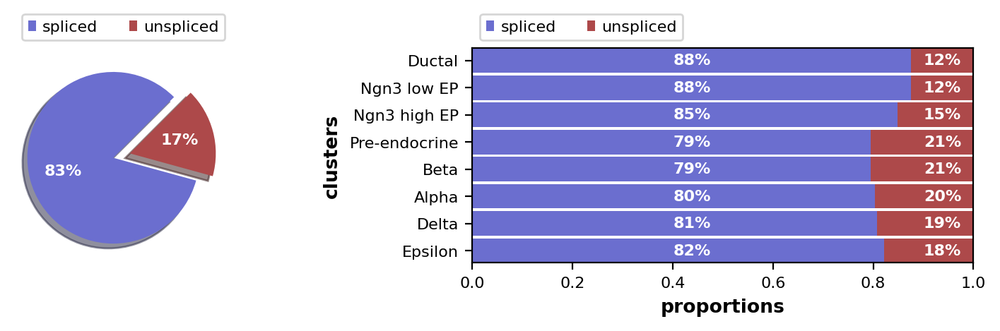

In [9]:
scv.pl.proportions(adata)

In [10]:
scv.pp.filter_genes(adata, min_shared_counts=20)
scv.pp.normalize_per_cell(adata, enforce=True)
scv.pp.filter_genes_dispersion(adata, n_top_genes=2000)
scv.pp.log1p(adata)

Filtered out 20801 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.


/tmp/ipykernel_3602/1148954210.py:4: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  scv.pp.log1p(adata)


In [11]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
scv.tl.recover_dynamics(adata)  # If using dynamical model
scv.tl.velocity(adata, mode='dynamical')  # Compute velocity
scv.tl.velocity_graph(adata)  # Construct velocity graph

Filtered out 55 genes that are detected 20 counts (shared).
Logarithmized X.
computing neighbors


/home/savita/miniconda3/envs/py3/lib/python3.11/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)
/tmp/ipykernel_3602/183617169.py:2: DeprecationWarning: Automatic neighbor calculation is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors first with Scanpy.
  scv.pp.moments(adata, n_pcs=30, n_neighbors=30)
/home/savita/miniconda3/envs/py3/lib/python3.11/site-packages/scvelo/preprocessing/moments.py:71: DeprecationWarning: `neighbors` is deprecated since scvelo==0.4.0 and will be removed in a future version of scVelo. Please compute neighbors with Scanpy.
  neighbors(
2025-05-26 12:06:14.387966: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computat

    finished (0:00:22) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 1/12 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:14:21) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:05) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/12 cores)
    finished (0:00:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [12]:
print(adata.layers.keys()) 

KeysView(Layers with keys: spliced, unspliced, Ms, Mu, fit_t, fit_tau, fit_tau_, velocity, velocity_u)


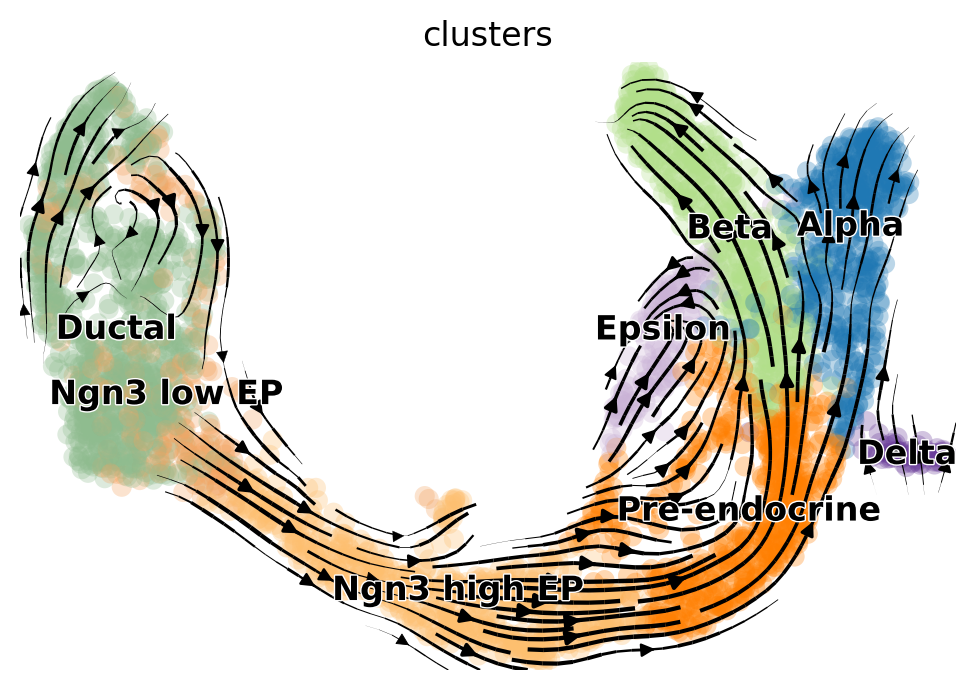

In [23]:
scv.pl.velocity_embedding_stream(adata, basis='umap')

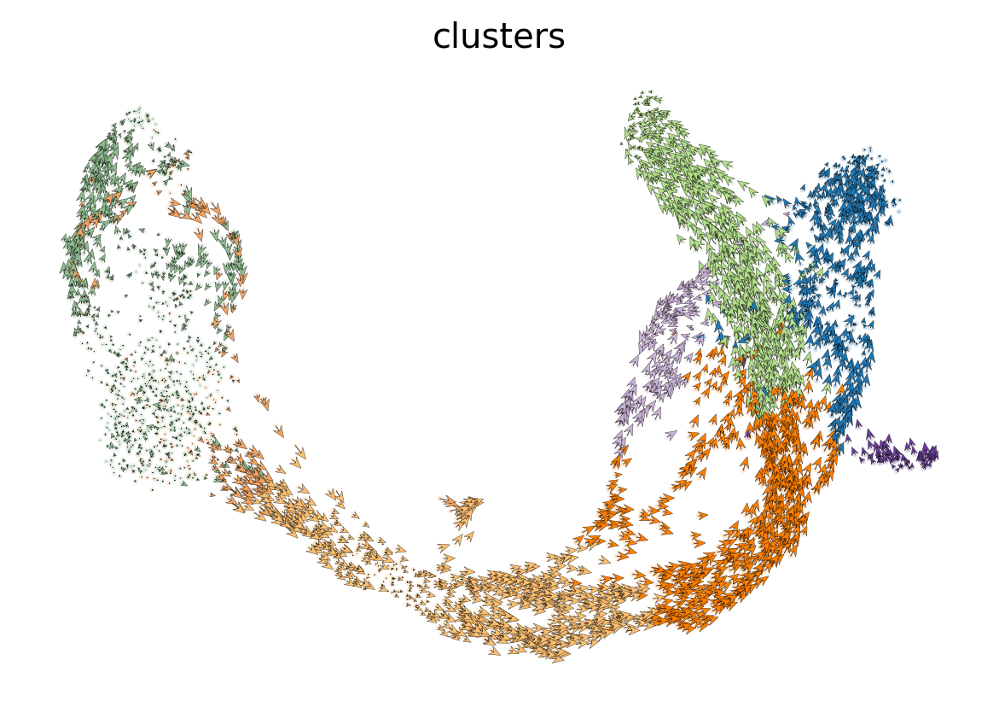

In [24]:
scv.pl.velocity_embedding(adata, arrow_length=3, arrow_size=2, dpi=120)

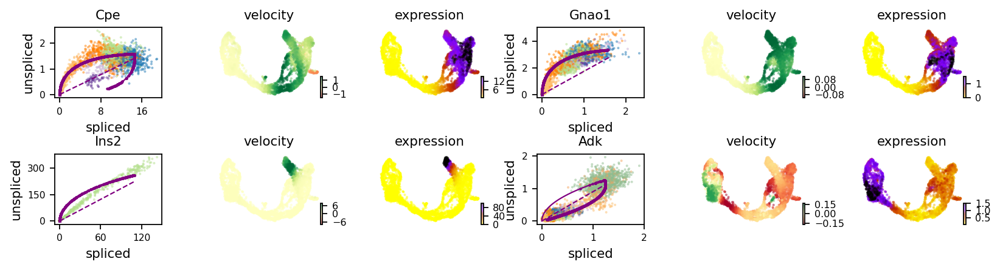

In [25]:
scv.pl.velocity(adata, ['Cpe',  'Gnao1', 'Ins2', 'Adk'], ncols=2)

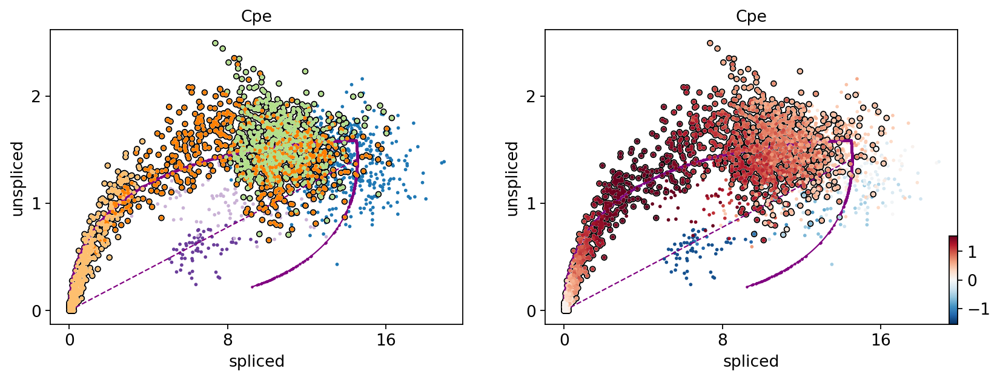

In [26]:
scv.pl.scatter(adata, 'Cpe', color=['clusters', 'velocity'],
               add_outline='Ngn3 high EP, Pre-endocrine, Beta')

In [27]:
scv.tl.rank_velocity_genes(adata, groupby='clusters', min_corr=0.3)  # Rank genes

ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [28]:
import pandas as pd
df = pd.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,Notch2,Notch2,Ptprs,Syt7,Kctd8,Skap1,Fam213a,Jup
1,Krt8,Idh2,Sel1l,Abcc8,Nnat,Gpr179,P2ry1,Gpr179
2,Cald1,Cald1,Vwa5b2,Scg5,Sphkap,Rab27a,Pdia5,Prdx4
3,Tcf7l2,2010107G23Rik,Tgfbr1,Baiap3,Sdk2,Nfasc,Gpr179,Rab27a
4,4833439L19Rik,4833439L19Rik,Mtch1,Pcsk2,Rgs9,Slc29a4,Hat1,Syt13


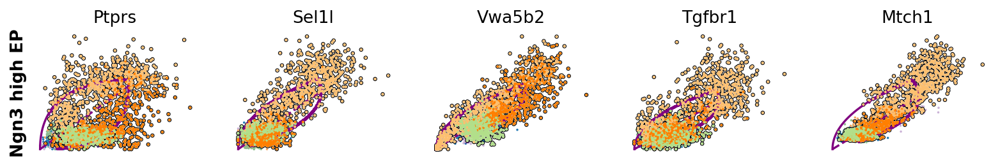

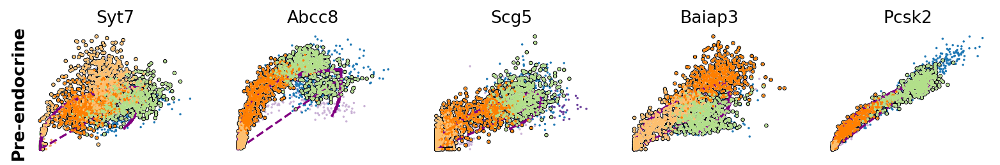

In [29]:
kwargs = dict(frameon=False, size=10, linewidth=1.5,
              add_outline='Ngn3 high EP, Pre-endocrine, Beta')

scv.pl.scatter(adata, df['Ngn3 high EP'][:5], ylabel='Ngn3 high EP', **kwargs)
scv.pl.scatter(adata, df['Pre-endocrine'][:5], ylabel='Pre-endocrine', **kwargs)

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


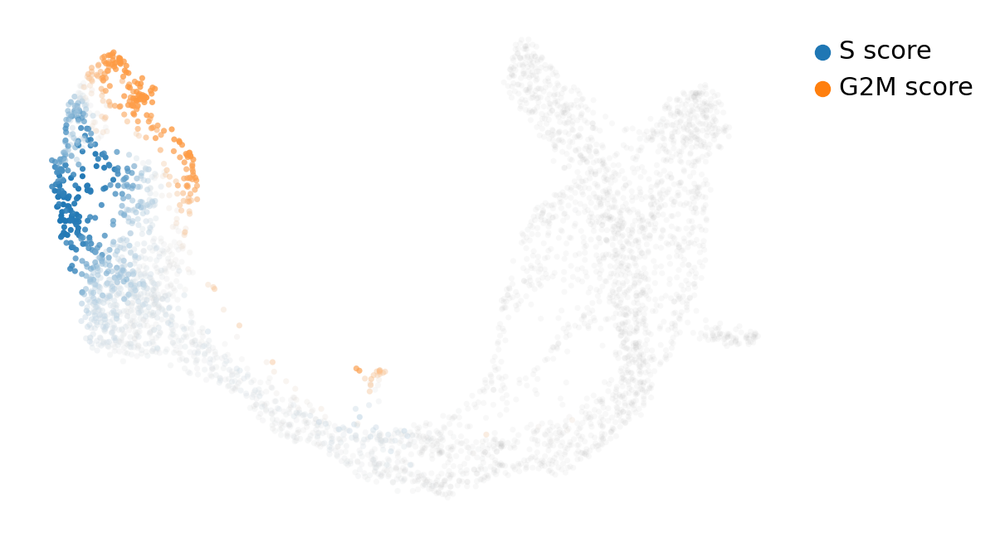

In [30]:
scv.tl.score_genes_cell_cycle(adata)
scv.pl.scatter(adata, color_gradients=['S_score', 'G2M_score'], smooth=True, perc=[5, 95])

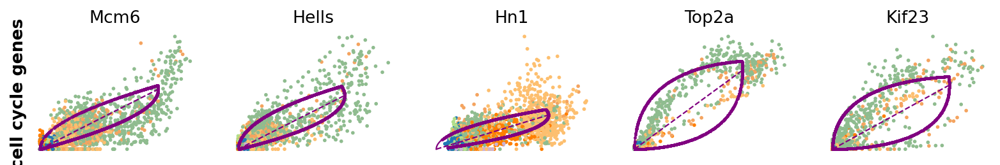

In [31]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(adata)
s_genes = scv.get_df(adata[:, s_genes], 'spearmans_score', sort_values=True).index
g2m_genes = scv.get_df(adata[:, g2m_genes], 'spearmans_score', sort_values=True).index

kwargs = dict(frameon=False, ylabel='cell cycle genes')
scv.pl.scatter(adata, list(s_genes[:2]) + list(g2m_genes[:3]), **kwargs)

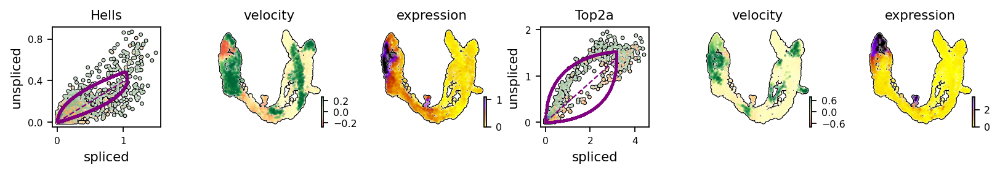

In [32]:
scv.pl.velocity(adata, ['Hells', 'Top2a'], ncols=2, add_outline=True)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


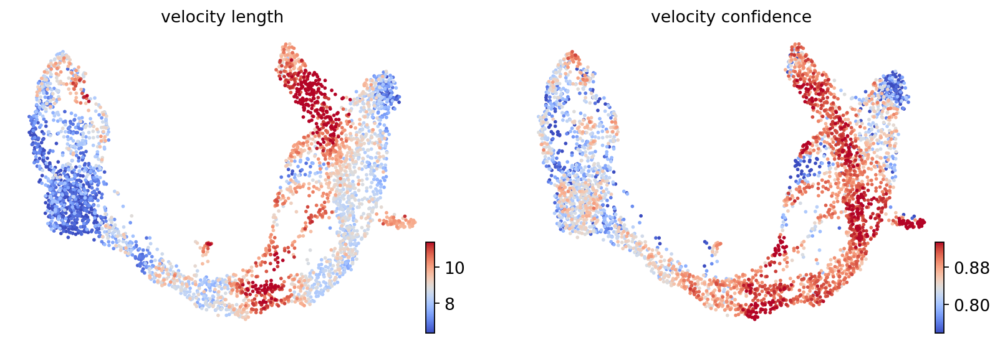

In [33]:
scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

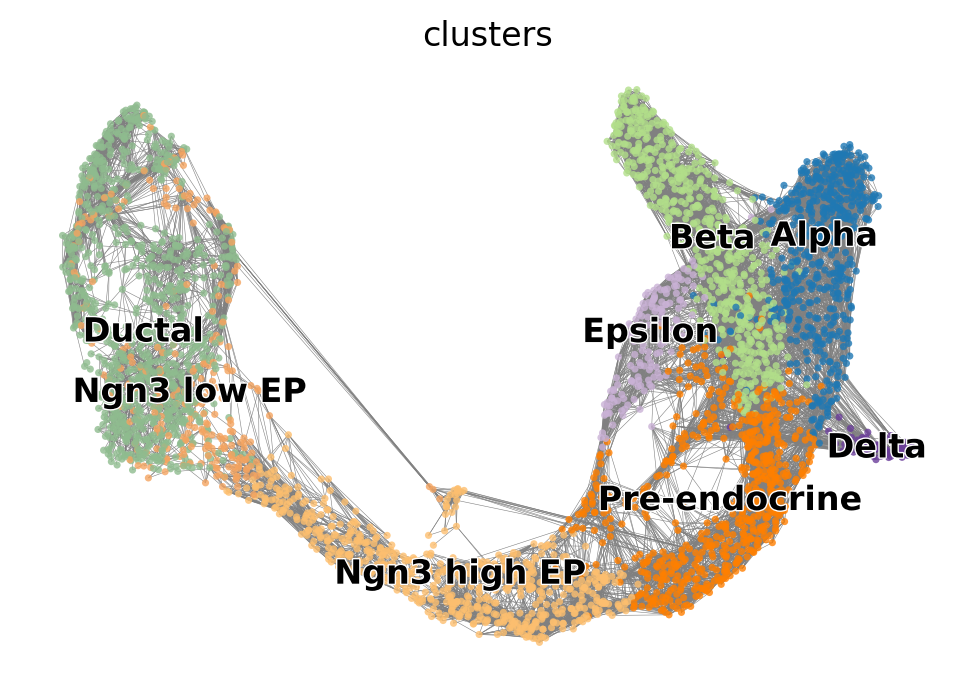

In [34]:
scv.pl.velocity_graph(adata, threshold=.1)

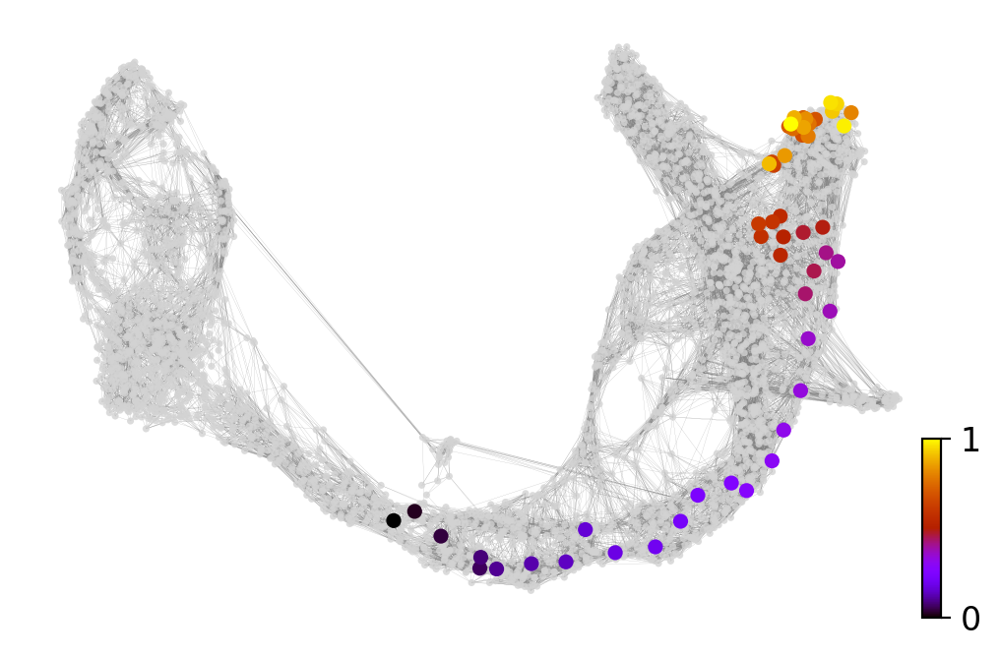

In [35]:
x, y = scv.utils.get_cell_transitions(adata, basis='umap', starting_cell=70)
ax = scv.pl.velocity_graph(adata, c='lightgrey', edge_width=.05, show=False)
ax = scv.pl.scatter(adata, x=x, y=y, s=120, c='ascending', cmap='gnuplot', ax=ax)

computing terminal states
    identified 2 regions of root cells and 1 region of end points .
    finished (0:00:03) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


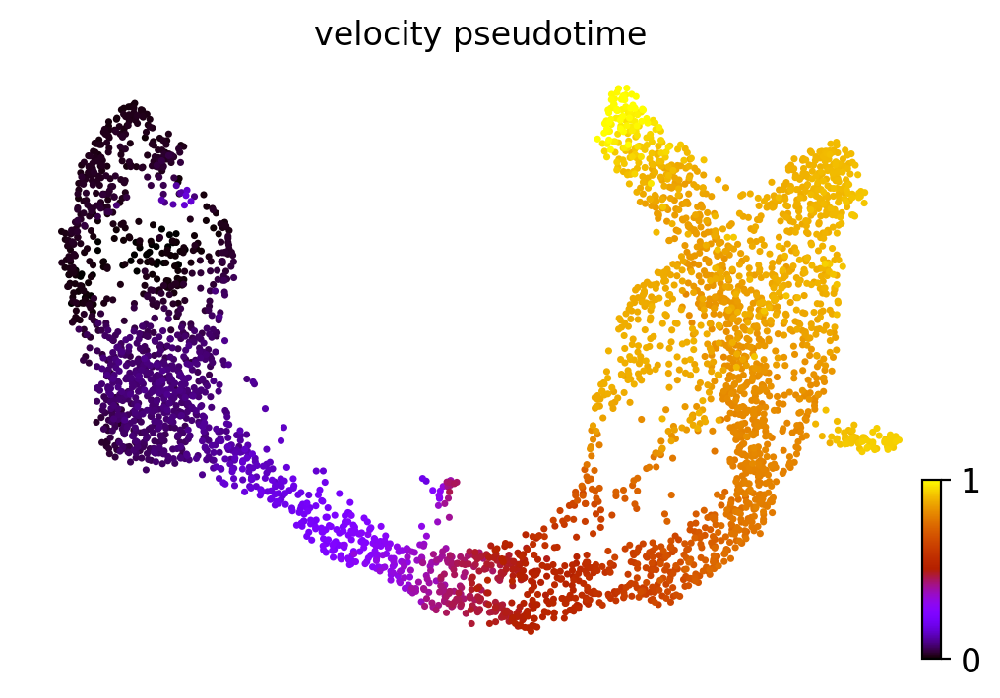

In [36]:
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot')

computing latent time using root_cells as prior
    finished (0:00:04) --> added 
    'latent_time', shared time (adata.obs)


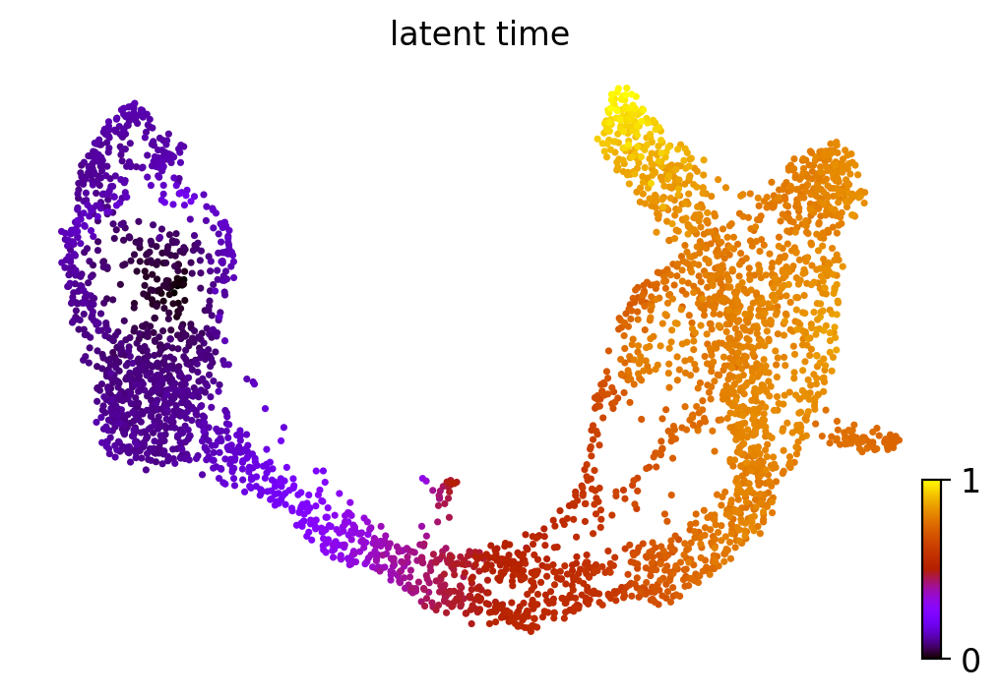

In [43]:
#scVelo can automatically compute latent time without explicitly specifying root cells, and in fact, 
#scVelo’s tl.latent_time() function automatically infers the root cells when using the dynamical model.

scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', cmap='gnuplot')

In [45]:
# PAGA requires to install igraph, if not done yet.
#!pip install python-igraph --upgrade --quiet

In [46]:
# this is needed due to a current bug - bugfix is coming soon.
adata.uns['neighbors']['distances'] = adata.obsp['distances']
adata.uns['neighbors']['connectivities'] = adata.obsp['connectivities']

scv.tl.paga(adata, groups='clusters')
df = scv.get_df(adata, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')


running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:01) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
Ductal,0,0.12,0,0,0,0,0,0
Ngn3 low EP,0,0,0.17,0,0,0,0,0
Ngn3 high EP,0,0,0,0.21,0,0,0,0
Pre-endocrine,0,0,0,0,0.4,0.22,0.12,0.11
Beta,0,0,0,0,0,0,0,0
Alpha,0,0,0,0,0,0,0,0
Delta,0,0,0,0,0,0,0,0
Epsilon,0,0,0,0,0,0,0,0


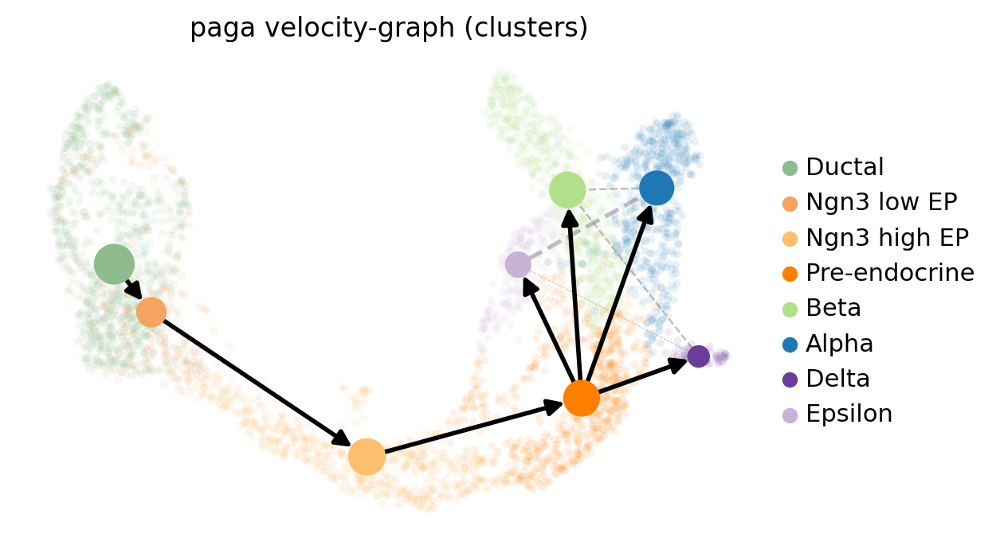

In [47]:
scv.pl.paga(adata, basis='umap', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5)

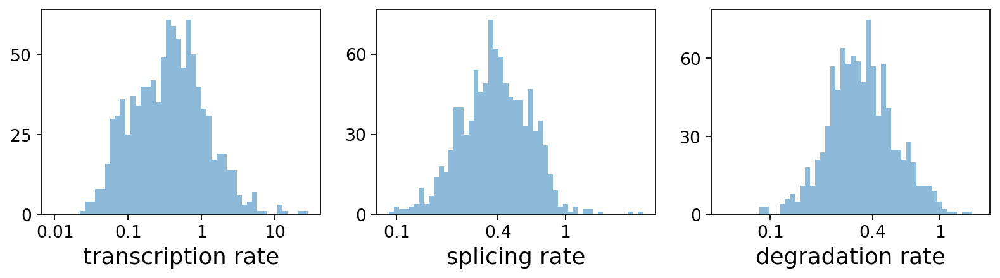

,fit_r2,fit_alpha,fit_beta,fit_gamma,fit_t_,fit_scaling,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
index,,,,,,,,,,,,,,,,
Sntg1,0.40,0.02,5.59e-03,0.09,23.40,42.85,1.03,0.03,0.41,0.0,0.0,0.16,2.47,0.09,0.15,5.36
Snhg6,0.13,0.39,2.98e+00,0.26,6.98,0.07,0.04,0.25,0.24,0.0,0.0,0.40,0.11,0.60,0.76,2.04
Sbspon,0.62,0.46,2.44e+00,0.38,3.79,0.15,0.06,0.18,0.25,0.0,0.0,0.18,0.16,0.43,0.67,1.19
Mcm3,0.29,3.10,4.00e+01,0.64,2.05,0.01,0.02,0.67,0.23,0.0,0.0,0.47,0.05,1.93,0.69,0.89
Fam135a,0.38,0.17,1.18e-01,0.20,11.24,1.12,0.36,0.15,0.28,0.0,0.0,0.39,1.35,0.39,0.67,3.39


In [48]:
df = adata.var
df = df[(df['fit_likelihood'] > .1) & df['velocity_genes'] == True]

kwargs = dict(xscale='log', fontsize=16)
with scv.GridSpec(ncols=3) as pl:
    pl.hist(df['fit_alpha'], xlabel='transcription rate', **kwargs)
    pl.hist(df['fit_beta'] * df['fit_scaling'], xlabel='splicing rate', xticks=[.1, .4, 1], **kwargs)
    pl.hist(df['fit_gamma'], xlabel='degradation rate', xticks=[.1, .4, 1], **kwargs)

scv.get_df(adata, 'fit*', dropna=True).head()


computing latent time using root_cells as prior
    finished (0:00:04) --> added 
    'latent_time', shared time (adata.obs)


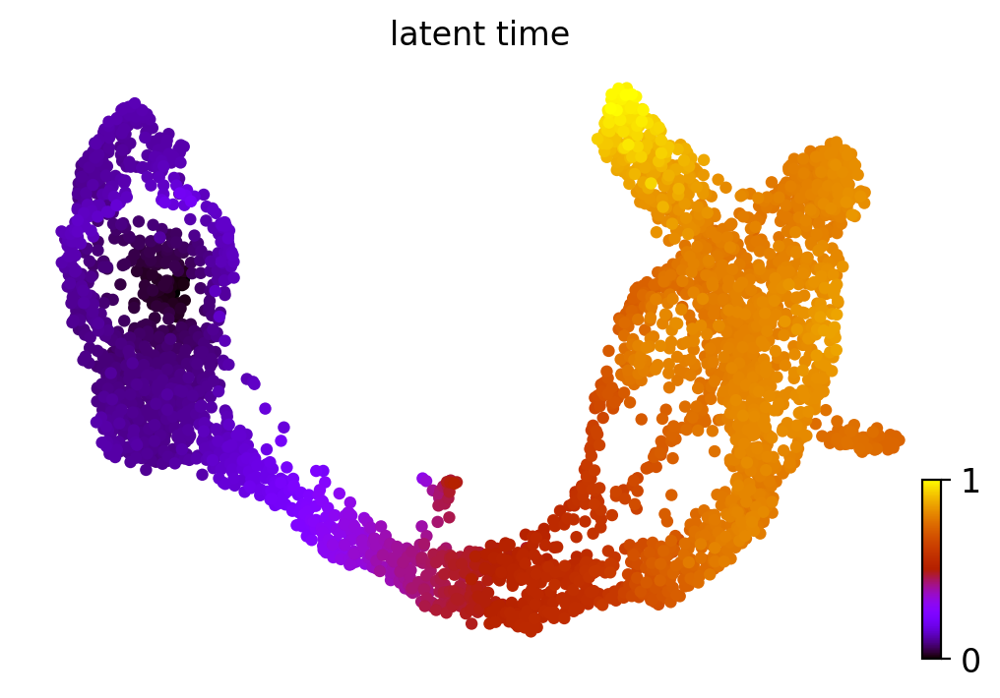

In [49]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

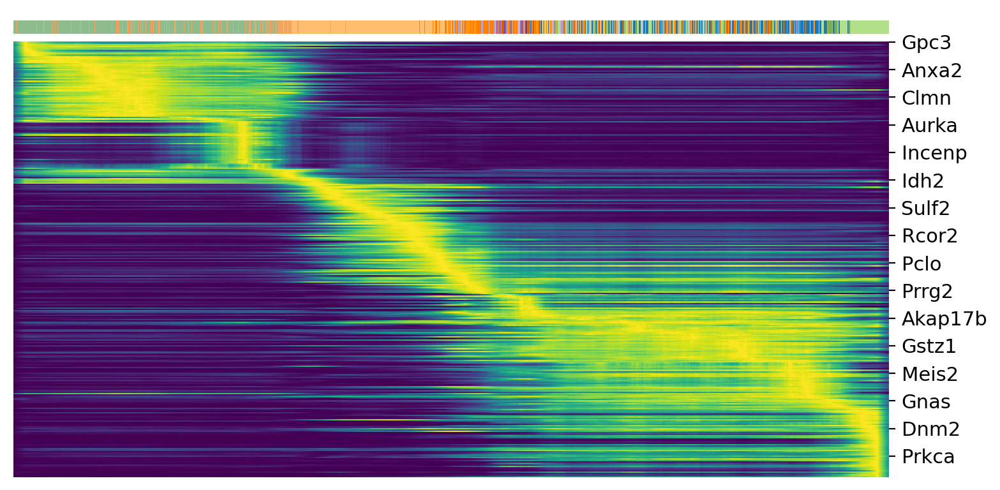

In [51]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', col_color='clusters', n_convolve=100)

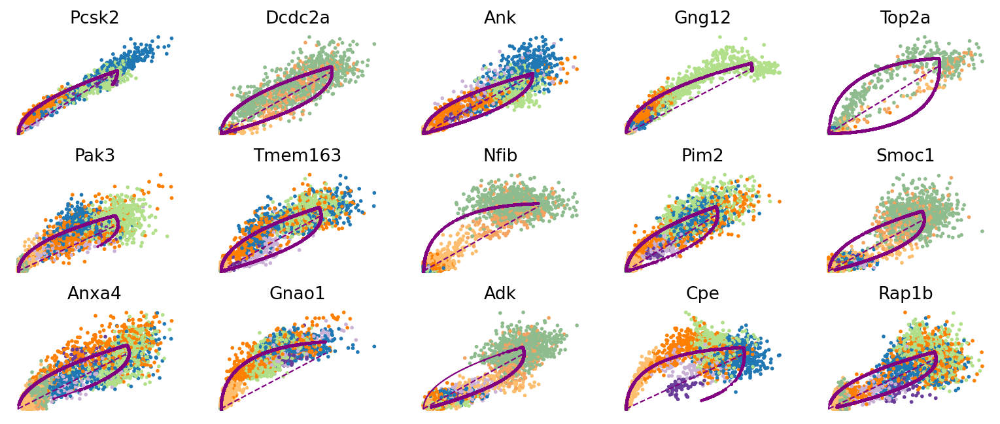

In [52]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, frameon=False)

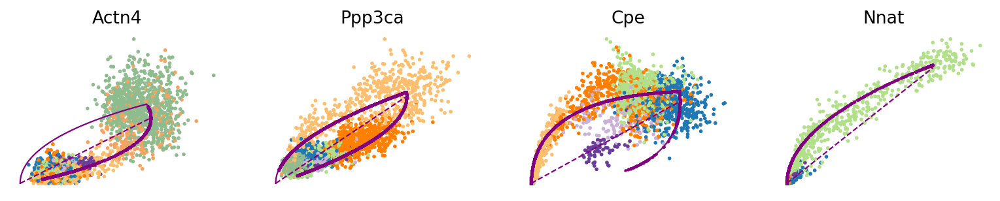

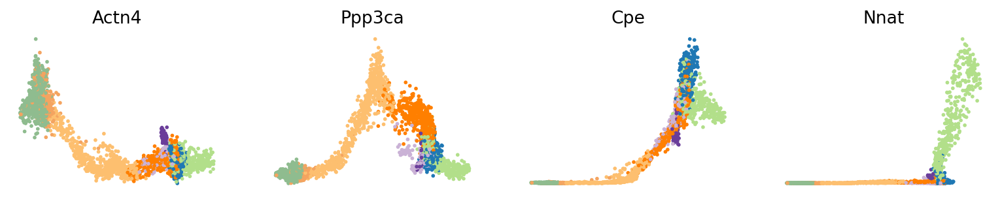

In [56]:
var_names = ['Actn4', 'Ppp3ca', 'Cpe', 'Nnat']
scv.pl.scatter(adata, var_names, frameon=False)
scv.pl.scatter(adata, x='latent_time', y=var_names, frameon=False)

In [57]:
scv.tl.rank_dynamical_genes(adata, groupby='clusters')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

ranking genes by cluster-specific likelihoods
    finished (0:00:05) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


,Ductal,Ngn3 low EP,Ngn3 high EP,Pre-endocrine,Beta,Alpha,Delta,Epsilon
0,Dcdc2a,Dcdc2a,Rbfox3,Abcc8,Pcsk2,Cpe,Pcsk2,Tox3
1,Top2a,Adk,Mapre3,Tmem163,Ank,Gnao1,Rap1b,Rnf130
2,Nfib,Mki67,Btbd17,Gnao1,Tmem163,Pak3,Pak3,Meis2
3,Wfdc15b,Rap1gap2,Sulf2,Ank,Tspan7,Pim2,Abcc8,Adk
4,Cdk1,Top2a,Tcp11,Tspan7,Map1b,Map1b,Klhl32,Rap1gap2


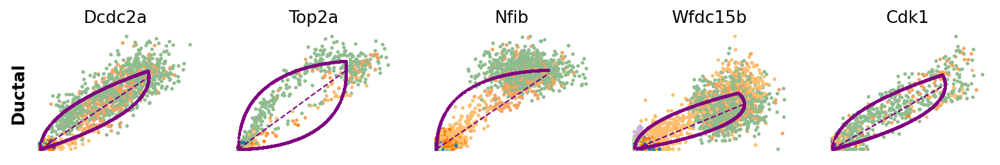

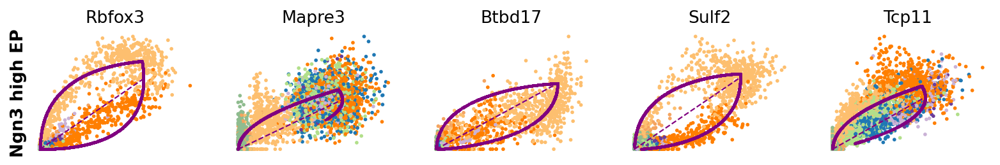

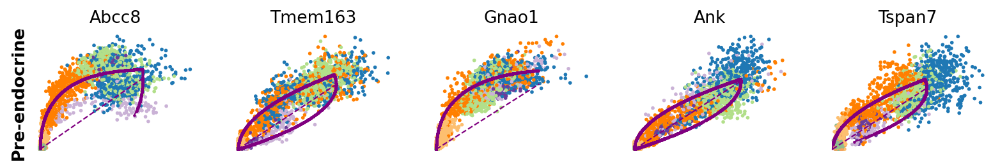

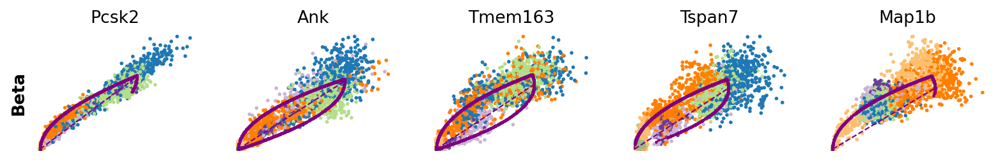

In [55]:
for cluster in ['Ductal', 'Ngn3 high EP', 'Pre-endocrine', 'Beta']:
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, frameon=False)

In [4]:
## Different dataset (Dentate Gyrus)

In [5]:
adata2 = scv.datasets.dentategyrus()

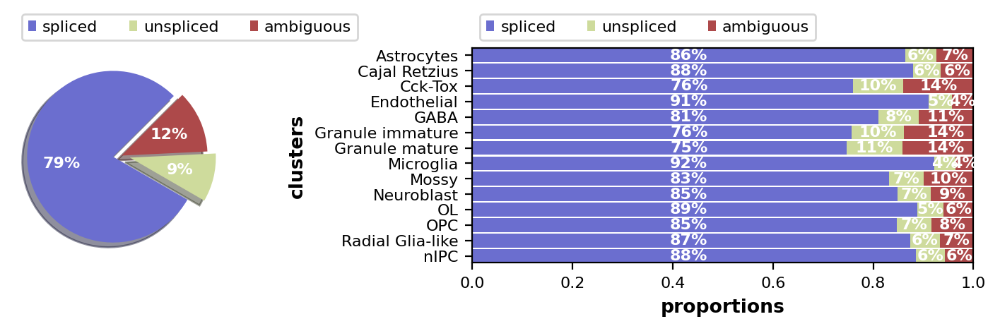

In [36]:
scv.pl.proportions(adata2)

In [14]:
scv.pp.filter_and_normalize(adata2, min_shared_counts=30, n_top_genes=2000)
scv.pp.moments(adata2, n_pcs=30, n_neighbors=30)

/home/savita/miniconda3/envs/py3/lib/python3.11/site-packages/scvelo/preprocessing/utils.py:705: DeprecationWarning: `log1p` is deprecated since scVelo v0.3.0 and will be removed in a future version. Please use `log1p` from `scanpy.pp` instead.
  log1p(adata)


In [18]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [19]:
scv.tl.velocity(adata2)
scv.tl.velocity_graph(adata2)

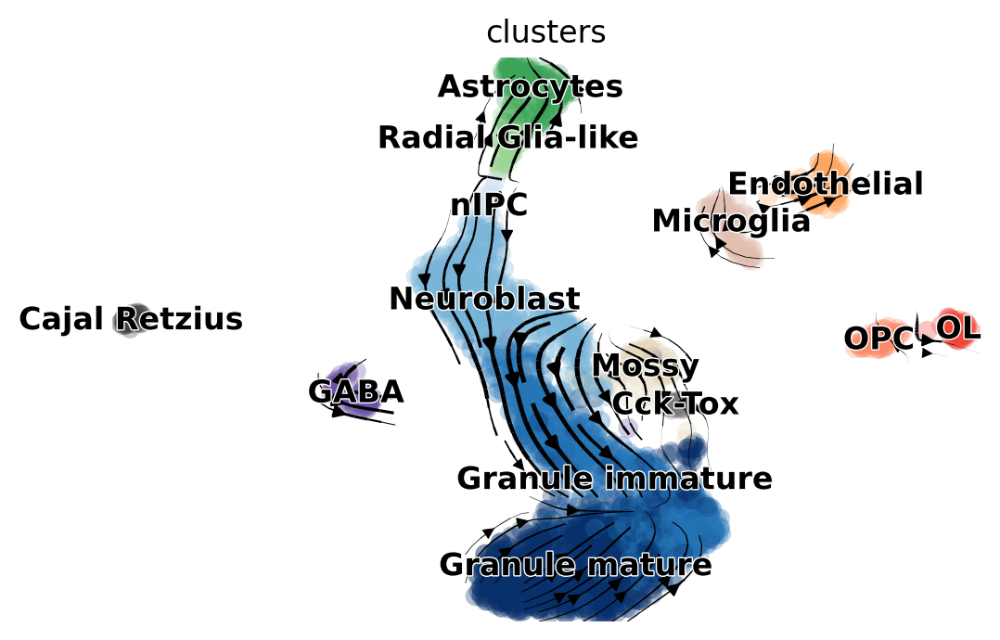

In [20]:
scv.pl.velocity_embedding_stream(adata2, basis='umap')

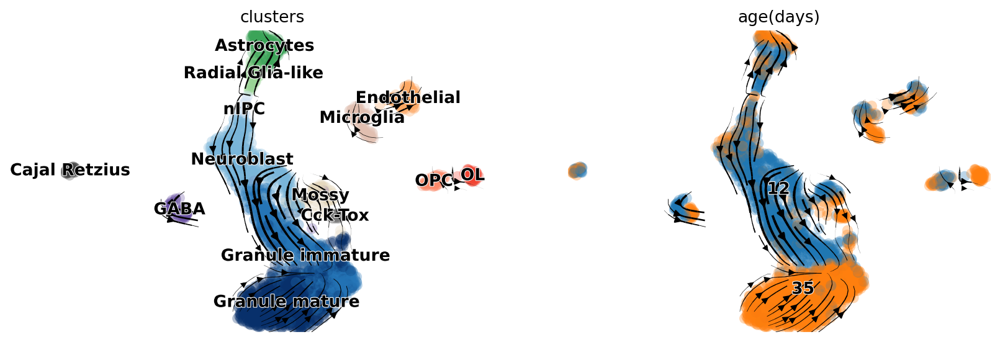

In [21]:
scv.pl.velocity_embedding_stream(adata2, basis='umap', color=['clusters', 'age(days)'])

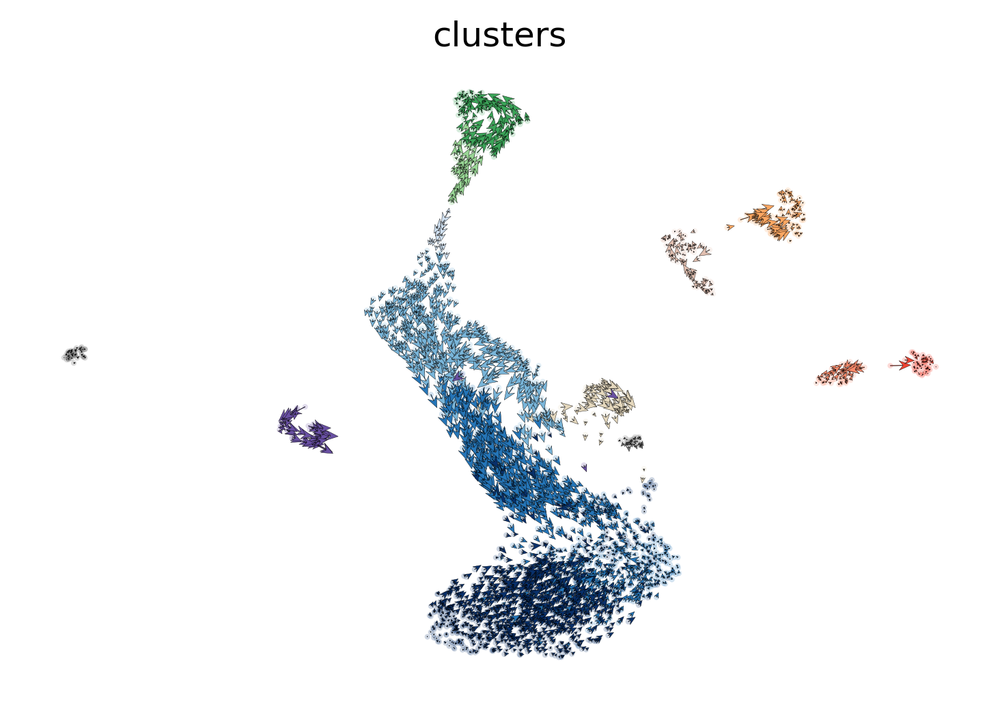

In [22]:
scv.pl.velocity_embedding(adata2, basis='umap', arrow_length=2, arrow_size=2, dpi=150)

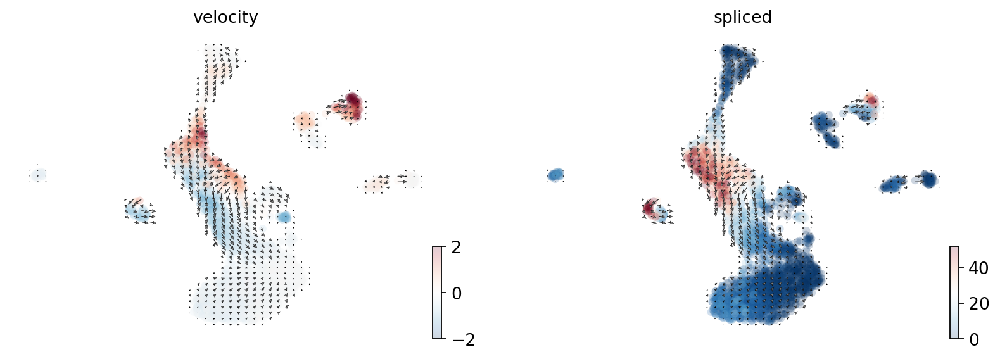

In [23]:
scv.pl.velocity_embedding_grid(adata2, color='Tmsb10',
                               layer=['velocity', 'spliced'], arrow_size=1.5)

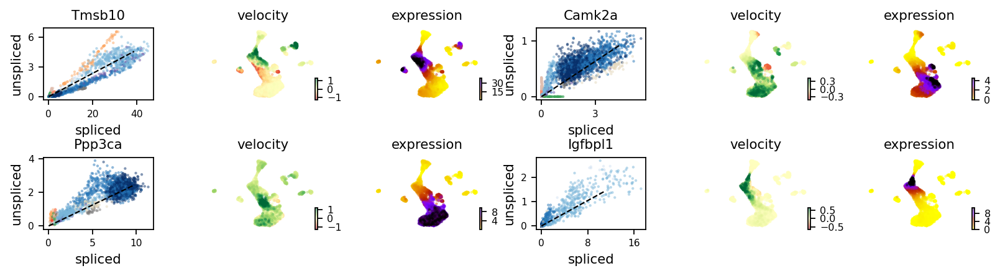

In [24]:
var_names = ['Tmsb10', 'Camk2a', 'Ppp3ca', 'Igfbpl1']
scv.pl.velocity(adata2, var_names=var_names, colorbar=True, ncols=2)

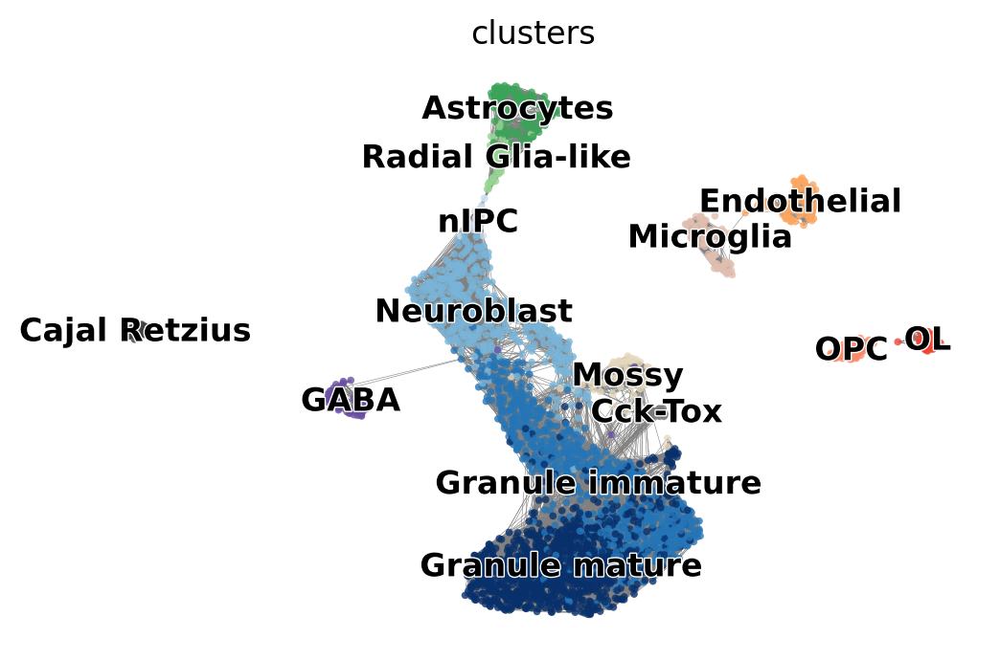

In [25]:
scv.pl.velocity_graph(adata2)

In [26]:
var_names = ['Tmsb10', 'Fam155a', 'Hn1', 'Rpl6']
scv.tl.differential_kinetic_test(adata2, var_names=var_names, groupby='clusters')

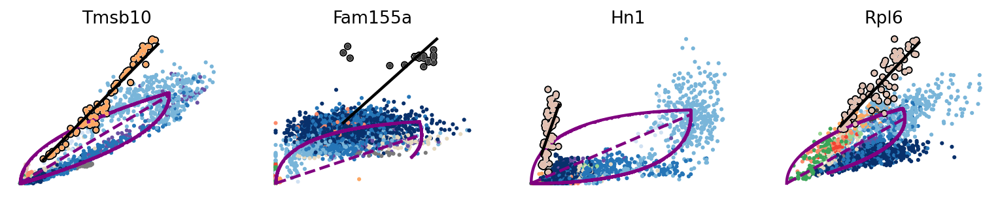

In [27]:
kwargs = dict(linewidth=2, add_linfit=True, frameon=False)
scv.pl.scatter(adata2, basis=var_names, add_outline='fit_diff_kinetics', **kwargs)

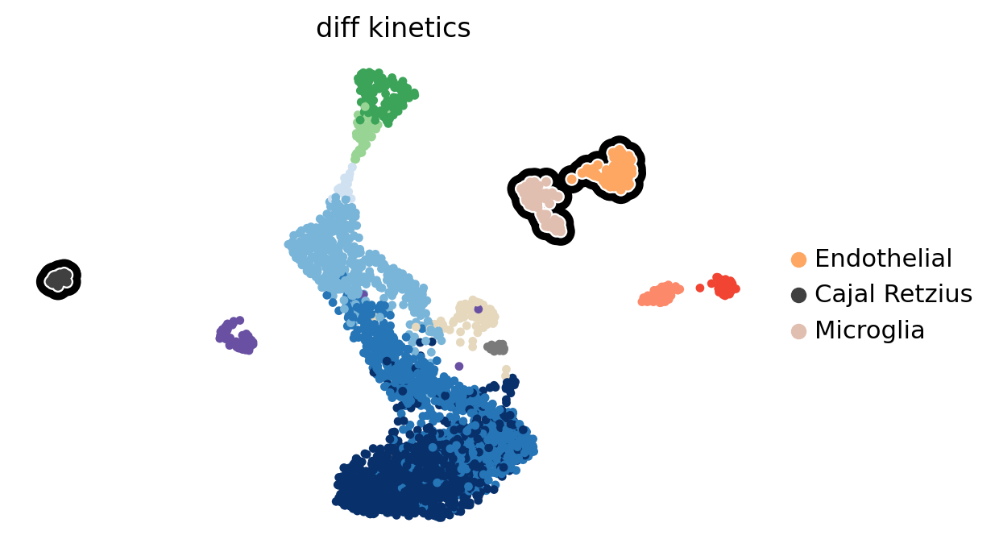

In [28]:
diff_clusters=list(adata2[:, var_names].var['fit_diff_kinetics'])
scv.pl.scatter(adata2, legend_loc='right', size=60, title='diff kinetics',
               add_outline=diff_clusters, outline_width=(.8, .2))

In [29]:
scv.tl.recover_dynamics(adata2)

#adata.write('data/dentategyrus.h5ad', compression='gzip')
#adata = scv.read('data/dentategyrus.h5ad')

In [39]:
scv.tl.rank_dynamical_genes(adata2, groupby='clusters')
df = scv.get_df(adata2, 'rank_dynamical_genes/names')
df.head(5)

,Astrocytes,Cajal Retzius,Cck-Tox,Endothelial,GABA,Granule immature,Granule mature,Microglia,Mossy,Neuroblast,OL,OPC,Radial Glia-like,nIPC
0,Atp1a2,Gap43,Ppp3ca,Hba-a1,Npy,Grin2b,Ppp3ca,Hpgds,Ppp3ca,Ppp3ca,Cryab,Scrg1,Atp1a2,Tmsb10
1,Slc1a3,Cdkn1c,Stmn2,Col1a2,Map1b,Map1b,Erc2,Gatm,Cplx2,Gria1,Cldn11,Dlgap1,Gfap,Fbxo30
2,Mt2,Col11a1,Rasgrf1,Crip1,Tmsb10,Ak5,Btbd9,Rnaset2b,Map1b,Tmsb10,Sept4,Gria4,Tcf4,Rpl6
3,Slco1c1,Rpl6,Tshz2,BC028528,Gad2,Kcnd2,Grin2b,Lgmn,Gap43,Map1b,Ppp1r14a,Cdc40,Gm4285,Epha4
4,Gja1,Syn2,Map1b,Flt1,Gap43,Nsf,Map1b,Hmha1,Nsf,Btbd9,Enpp2,Rpl6,Scrg1,Trim59


In [37]:
top_genes = adata2.var['fit_likelihood'].sort_values(ascending=False).index[:100]
scv.tl.differential_kinetic_test(adata2, var_names=top_genes, groupby='clusters')

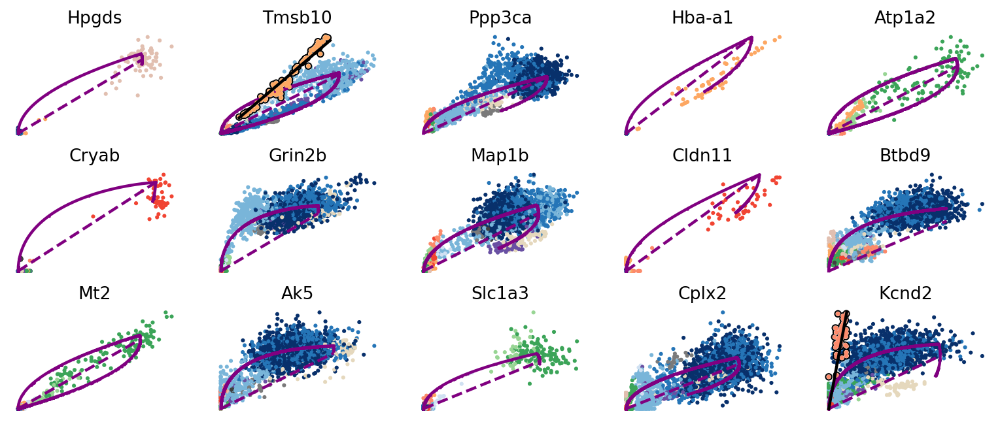

In [32]:
scv.pl.scatter(adata2, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics', **kwargs)

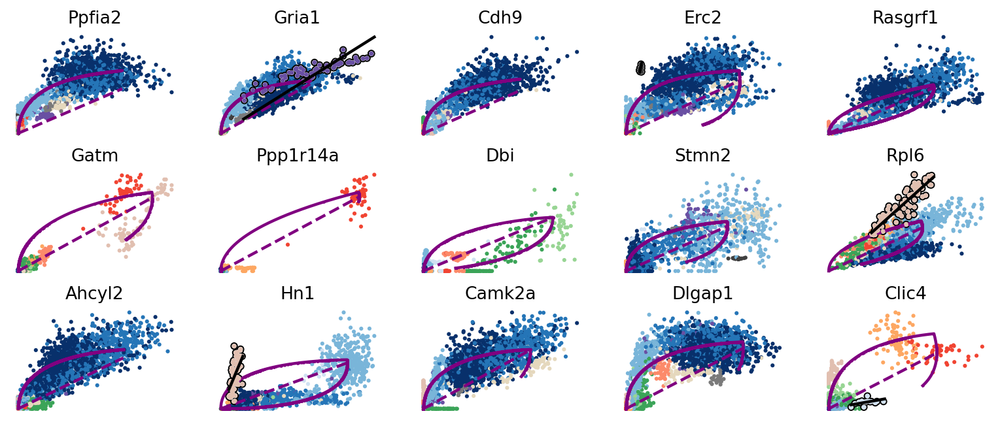

In [33]:
scv.pl.scatter(adata2, basis=top_genes[15:30], ncols=5, add_outline='fit_diff_kinetics', **kwargs)

In [34]:
scv.tl.velocity(adata2, diff_kinetics=True)
scv.tl.velocity_graph(adata2)

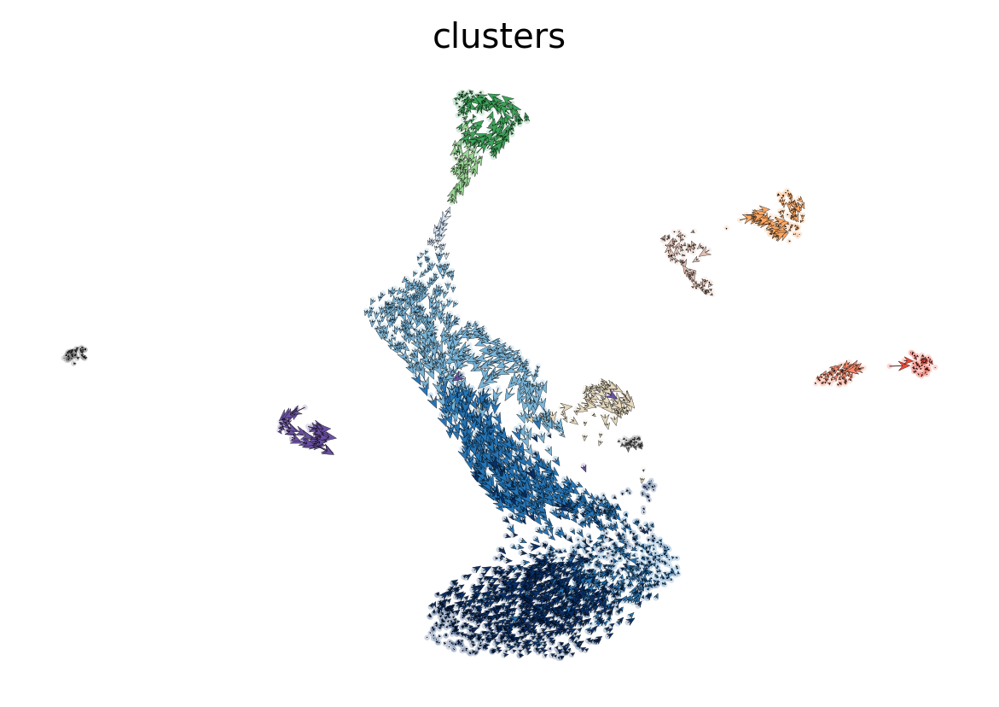

In [35]:
scv.pl.velocity_embedding(adata2, dpi=120, arrow_size=2, arrow_length=2)